# Tarea 4 Curso Análisis y Limpieza de datos.


### Profesor responsable: Jorge Alexis Castillo Sepúlveda
### Alumno: Alejandro Méndez Miranda

### Librerías utilizadas

In [1]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# 1- Construya una matriz 𝐴, tal que en las filas y en las columnas, columnas se encuentren los nombres de los directores, y en donde la entrada (𝑗,𝑘) de la matriz sean la cantidad de razones sociales en común que tengan los directores 𝑗 y 𝑘. Notar que esta definición es una definición de relación múltiple.

In [2]:
#Se cargan los datos del enlace provisto.
data = pd.read_excel("directores.xlsx")
data

,RUT,Nombre,Cargo,Fecha Nombramiento,Directorio
0,70563495,PABLO TURNER GONZÁLEZ,Presidente,2018-08-27,1
1,68617421,JAIME FERNANDO SANTA CRUZ NEGRI,Vicepresidente,2018-08-27,1
2,63702153,DIEGO VIDAL SANCHEZ,Director,2018-08-27,1
3,68334543,FRESIA MARGARITA HANCKES ESTEFAN,Director,2018-08-27,1
4,6861743K,JUAN PABLO SANTA CRUZ NEGRI,Director,2018-08-27,1
...,...,...,...,...,...
2468,5191340K,FELIPE AGUSTIN TOMAS PEREZ WALKER,Director,2018-05-23,328
2469,63737542,RAUL MANFREDO ARONSOHN FALICKMANN,Director,2018-05-23,328
2470,69949886,PATRICIO ARMANDO DUSSAILLANT BALBONTIN,Director,2018-05-23,328
2471,8302190K,ADRIANA ALICIA TAPIA CIFUENTES,Director,2018-05-23,328


In [3]:
#Se analiza un director para revisar si pertenecen a más de un directorio
data[data.Nombre == "BERNARDO MATTE LARRAIN"]

,RUT,Nombre,Cargo,Fecha Nombramiento,Directorio
244,65987287,BERNARDO MATTE LARRAIN,Presidente,2017-04-25,31
587,65987287,BERNARDO MATTE LARRAIN,Presidente,2018-05-09,77
838,65987287,BERNARDO MATTE LARRAIN,Director,2017-04-27,108
882,65987287,BERNARDO MATTE LARRAIN,Director,2016-04-29,114


Se desprende que no solo hay gente con el cargo de director, en este caso, Bernardo Matte Larrain ejerció el cargo de presidente. Por esto se analizarán los valores de la columna "Cargo".

In [4]:
data.Cargo.unique()

array(['Presidente', 'Vicepresidente', 'Director', 'Director Suplente',
       'Administrador', 'Presidente Comision Liquidadora', 'Liquidador',
       'Vicepresidente Comision Liquidora'], dtype=object)

Aunque existan distintos cargos la idea de este trabajo es analizar la red que conecte las personas que han trabajado indeferente de su cargo.

In [5]:
#Bernardo Matte Larrain ejerciendo el cargo de presidente en el directorio 31
data[data.Directorio == 31]

,RUT,Nombre,Cargo,Fecha Nombramiento,Directorio
244,65987287,BERNARDO MATTE LARRAIN,Presidente,2017-04-25,31
245,55230749,RENE JAVIER LEHUEDE FUENZALIDA,Director,2017-04-25,31
246,63717630,BERNARDO FONTAINE TALAVERA,Director,2017-04-25,31
247,69999387,VICENTE MONGE ALCALDE,Director,2017-04-25,31
248,70327295,JUAN CARLOS EYZAGUIRRE ECHENIQUE,Director,2017-04-25,31
249,70356651,JOSE MIGUEL IRARRAZAVAL ELIZALDE,Director,2017-04-25,31
250,105966342,KATHLEEN BARCLAY COLLINS,Director,2017-04-25,31
251,107501894,DEMETRIO ZAÑARTU BACARREZA,Director,2017-04-25,31
252,153639426,RODRIGO JOSÉ DONOSO MUNITA,Director,2017-04-25,31


In [6]:
#Bernardo Matte Larrain ejerciendo el cargo de director en el directorio 108
data[data.Directorio == 108]

,RUT,Nombre,Cargo,Fecha Nombramiento,Directorio
832,57152516,JUAN JOSÉ HURTADO VICUÑA,Presidente,2017-04-27,108
833,60690871,LUIS FELIPE GAZITUA ACHONDO,Vicepresidente,2017-04-27,108
834,52139384,CARLOS FERNANDEZ CALATAYUD,Director,2017-04-27,108
835,5543624K,JUAN JOSÉ MAC-AULIFFE GRANELLO,Director,2017-04-27,108
836,61495851,RICHARD BÜCHI BUC,Director,2017-04-27,108
837,65576155,JORGE PATRICIO SALVATIERRA PACHECO,Director,2017-04-27,108
838,65987287,BERNARDO MATTE LARRAIN,Director,2017-04-27,108
839,86612038,PATRICIO DANIEL PARODI GIL,Director,2017-04-27,108
840,96690819,ANDRES EDUARDO ECHEVERRIA SALAS,Director,2017-04-27,108


El enfoque que se fue realizando fue seleccionar las personas de un directorio en específico para luego generar una matriz donde  filas = columnas y una matriz rellena con 1. Luego ir uno a uno haciendo esto con los distintos directorios. Este enfoque se creo para que en el momento de ir generando el dibujo asegurarse de que las conecciones fueran bien hechas.

### Construcción de la matriz

In [7]:
#Se crea una matriz utilizando el directorio n°1 a la cual se le irán concatenando los datos
longitud = len(data[data.Directorio == 1])
colnames = data[data.Directorio == 1]["Nombre"].array
#Ya que existe una relación en cada una de ellas, la matriz se llena de 1
x = np.ones(longitud*longitud).reshape(longitud,longitud)
df1 = pd.DataFrame(x, columns = colnames, index = colnames)

In [8]:
#Se crea una matriz que recorra los valores únicos de un array de la columna directorio.
for i in np.unique(data["Directorio"].array):
    #Al iguial que la construcción anterior se crea una matriz llena de unos para cada directorio
    longitud = len(data[data.Directorio == i])
    colnames = data[data.Directorio == i]["Nombre"].array
    x = np.ones(longitud*longitud).reshape(longitud,longitud)
    #Se concatena la matriz creada a la matriz inicial
    df2 = pd.DataFrame(x, columns = colnames, index = colnames)
    df1 = pd.concat([df1, df2])
#Al realizar merge se generan valores NA donde no existan conecciones, estas se rellenan con 0
df1 = df1.fillna(0)
#Como se generan columnas distintas si el director aparece más de una vez se realiza un groupby().sum()
df1 = df1.groupby(df1.index).sum()
#Finalmente se ordenan las columnas
df1 = df1.reindex(sorted(df1.columns), axis=1)


In [9]:
#Para comprobar la cantidad de directores
len(np.unique(data["Nombre"].array))

1809

In [10]:
#Para comprobar como quedó formado el dataframe con el número de columnas y filas correctas
df1.shape

(1809, 1809)

In [11]:
len(data.Nombre.unique())

1809

Se observa que la estructura corresponde a la cantidad de directores que existe en el dataframe.

In [12]:
df1

,ABEL BOUCHON SILVA,ABRAHAM ALAMO YAGNAM,ADEBAYO OGUNLESI -,ADOLFO GOLDENSTEIN KLECKY,ADRIAN ALEJANDRO FERNANDEZ ROSEMBERG,ADRIAN GOSTUSKI .,ADRIANA ALICIA TAPIA CIFUENTES,ADRIANO ITURBE ESCANDON,AKIRA TERAO .,ALAN GUENDELMAN PORTUGUEIS,...,XIMENA PERRAMONT SANCHEZ,XIMENA ZAPATA R,YAKOB ANIBAL MOSA SHMES,YAQUB MIRZA .,YENNY NUN MELNICK,YERKO VILLELA LOPIZIC,YJIEL GUILLERMO NUN MELNICK,YOSHIRO HUILLCA .,YOVAN TRKOVIC MORENO,ÁNGEL FERNANDO CARVAJAL BENITO
ABEL BOUCHON SILVA,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ABRAHAM ALAMO YAGNAM,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADEBAYO OGUNLESI -,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADOLFO GOLDENSTEIN KLECKY,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADRIAN ALEJANDRO FERNANDEZ ROSEMBERG,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YERKO VILLELA LOPIZIC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0,0.0
YJIEL GUILLERMO NUN MELNICK,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
YOSHIRO HUILLCA .,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
YOVAN TRKOVIC MORENO,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [13]:
#Se observa que la diagonal contiene valores, para evitar autoloops se rellena con  0.
numpy_data = df1.to_numpy()
np.fill_diagonal(numpy_data, 0)


# 2- Construya el grafo asociado a la matriz 𝐴. Representarlo gráficamente, en donde los nodos más centrales se encuentren en el centro de la figura

In [14]:
#Se crea el objeto de networkx utilizando la matriz que contiene los valores
G = nx.from_numpy_matrix(df1.values)
#Se agrega el nombre de las columnas como labels al objeto de networkx llamado G por convención
dictionary = dict(zip(range(1809), df1.columns))
G = nx.relabel_nodes(G, dictionary)
#Se guarda en otra variable por seguridad y para crear subplots en el trabajo.
H = G

Con el objeto de networkx generado se realizará el plot y cálculos de métricas.

In [15]:
#Para analizar los datos se realiza un filtro de los directores que presentaron un grado mayor a 30.
data_filt = {key: dict(G.degree())[key] for key in dict(G.degree()) if dict(G.degree())[key] > 30}
data_filt

{'BERNARDO MATTE LARRAIN': 34,
 'CARLOS ALBERTO HELLER SOLARI': 39,
 'HERMAN CHADWICK PIÑERA': 50,
 'HERNAN ALBERTO BÜCHI BUC': 38,
 'HERNAN CHEYRE VALENZUELA': 38,
 'JUAN JOSÉ HURTADO VICUÑA': 32,
 'LEONIDAS VIAL ECHEVERRÍA': 35,
 'MIGUEL IGNACIO GUERRERO GUTIERREZ': 36,
 'RADOMIRO BLAS TOMIC ERRAZURIZ': 31}

Como podemos observar la información de networkx funciona en variables como diccionarios, esto ocurre para las métricas, para la posición, para las etiquetas, etc. Con este conocimiento se procederá a crear una función que pueda resumir la mayoría de los parámetros para semiautomatizar todo el proceso de dibujar la red.

In [16]:
def networkplot(limit, centrality_dict,scale = 40,wscale =1, howmiddle = 0.15,
                k_spring = 0.10, it_spring = 100, k_freu =0.16, it_freud = 5, seed = 500):


    # Se seleccionaron los directores con un grado mayor a limit
    limit = limit

    #Se crea un diccionario para ir variando el tamaño del nodo según la centralidad
    hh = centrality_dict
    #Se crea una lista vacía para ir agregando el tamaño de los nodos
    sizenode = []
    #Se recorre el diccionario
    for key, value in hh.items():
        #Como la escalas varían de distinta manera se crea una condicional para ajustar mejor el tamaño
        if wscale == 1:
            sizenode.append(value*scale)
        else:
            sizenode.append((1/np.log(value)*-1)*scale)
            

    
    #Para realizar el etiquetado con el nombre de los directores filtrados se realizó el siguiente procedimiento:
    #Se crea el diccionario con los grados
    ff = centrality_dict
    #Se recorren los elementos del diccionario
    for key, value in ff.items():
        #Para los valores de grado menores a limit se cambia el valor a un string vacío
        if value < limit:
            ff[key] = ""
        #Para los valores de grado mayor a limit se cambia el valor a un string con el nombre del director
        else:
            ff[key] = key
        #Finalmente se obtiene un diccionario que nos servirá para etiquetar a los directores con grado mayor a limit.

    # Para pintar los colores de los nodos con mayor grado se siguió que:
    
    #El parámetro de colores ahora tiene que ser una lista y no diccionario, es por esto que se crea una lista vacía
    color_map = []
    #Se recorren los valores del diccionario donde los directores con grado menor a limit contienen un string vacío
    for key, value in ff.items():
        #Si el valor del diccionario es "" (menor a limit) en este caso se agregará el color "coral" a la lista color_map
        if value == "":
            color_map.append('coral')
        #Si el valor del diccionario no es "" (es limit o mayor) agregará el color "firebrick" a la lista color_map
        else: 
            color_map.append('firebrick') 
        #De esta forma cada punto tendrá designado su color, en este caso se seleccionaron los colores coral
        #y firebrick por ser más fácil de visualizar.


    #Otro parámetro necesario es la posición de los nodos, hay distintos métodos para realizar geometrías.
    #Para este trabajo ralicé la combinación de dos: spring_layout y luego fruchterman_reingold_layout
    pos = nx.spring_layout(G,k=k_spring,iterations=it_spring,seed = seed)
    pos = nx.fruchterman_reingold_layout(G,pos = pos,k=k_freu,iterations=it_freud,seed = seed)

    #Luego de muchos intentos fallidos para que los nodos más centrales se generaran en el centro, se procedió
    #a ubicarlos manualmente pero de manera aleatoria en el cuadrante -0.2,0.2 en el plano.
    #La ventaja de trabajar con datos ordenados es que se pueden filtrar utilizando otro diccionario.
    #En este caso se modifica el diccionario pos según los valores del diccionario ff que contiene
    #los nodos de mayor valor.
    for key,value in ff.items():
        #Se crea la condicional para posicionar los nodos importantes, que en el diccionario ff son los que no
        #tienen como valor un string vacío o ""
        if value != "":
            pos[key] = np.array([np.random.uniform(-1*howmiddle,howmiddle),np.random.uniform(-1*howmiddle,howmiddle)])
        #Ahora si son un string vacío y están en el cuadrante [2,-2,2,-2] se desplazan hasta salir de este
        if value == "":
            while (pos[key][0] <0.2 and pos[key][1] <0.2) and  (pos[key][0] > -0.2 and pos[key][1] > -0.2):
                pos[key]  += 0.05
           

    #Finalmente se realiza el plot de los labels y nodos-aristas de manera separada con los parámetros creados.
    plt.figure(figsize=(40,40)) 
    
    #Se modifica la posición para desplazar hacia arriba las etiquetas y no queden superpuesta a los nodos
    for k in pos.keys():
        pos[k] += 0.05
    
    #Se dibujan las etiquetas (Se realiza antes de dibujar la red debido que de lo contrario imprime el diccionario
    #que contiene los labels)
    nx.draw_networkx_labels(G, pos=pos, labels = ff, font_size = 40, font_color = "firebrick")
    
    #Se modifica para desplazar al lugar correcto los nodos
    for k in pos.keys():
        pos[k] -= 0.05
         
    #Se dibuja la red  
    nx.draw(G, node_size = sizenode, pos = pos, node_color=color_map, edge_color= "teal")
    
    


### Dibujos de la red

**Red considerando el tamaño de nodo según su grado, se marcan los nodos con grado mayor a 35**

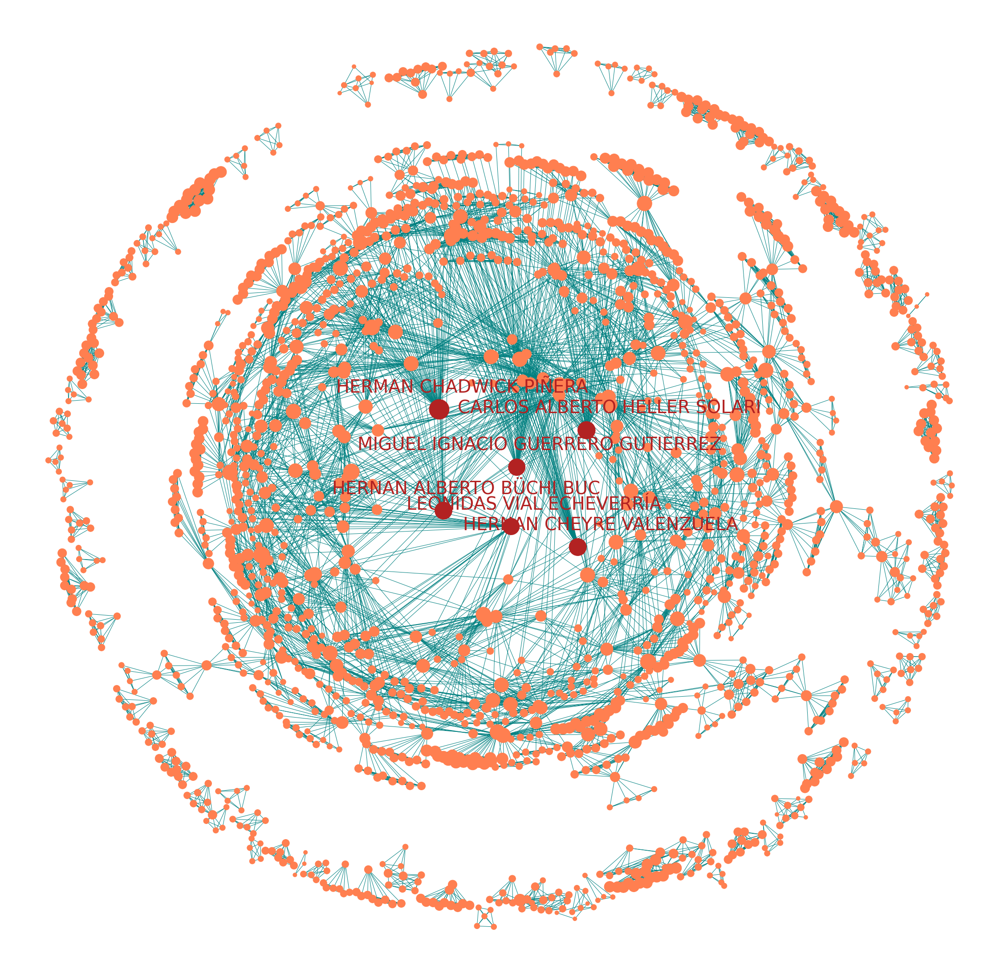

In [17]:
networkplot(35, dict(G.degree()), howmiddle = 0.18, seed = 300)

**Red considerando el tamaño de nodo según su grado del vector propio, se marcan los nodos con grado mayor a 0.23**

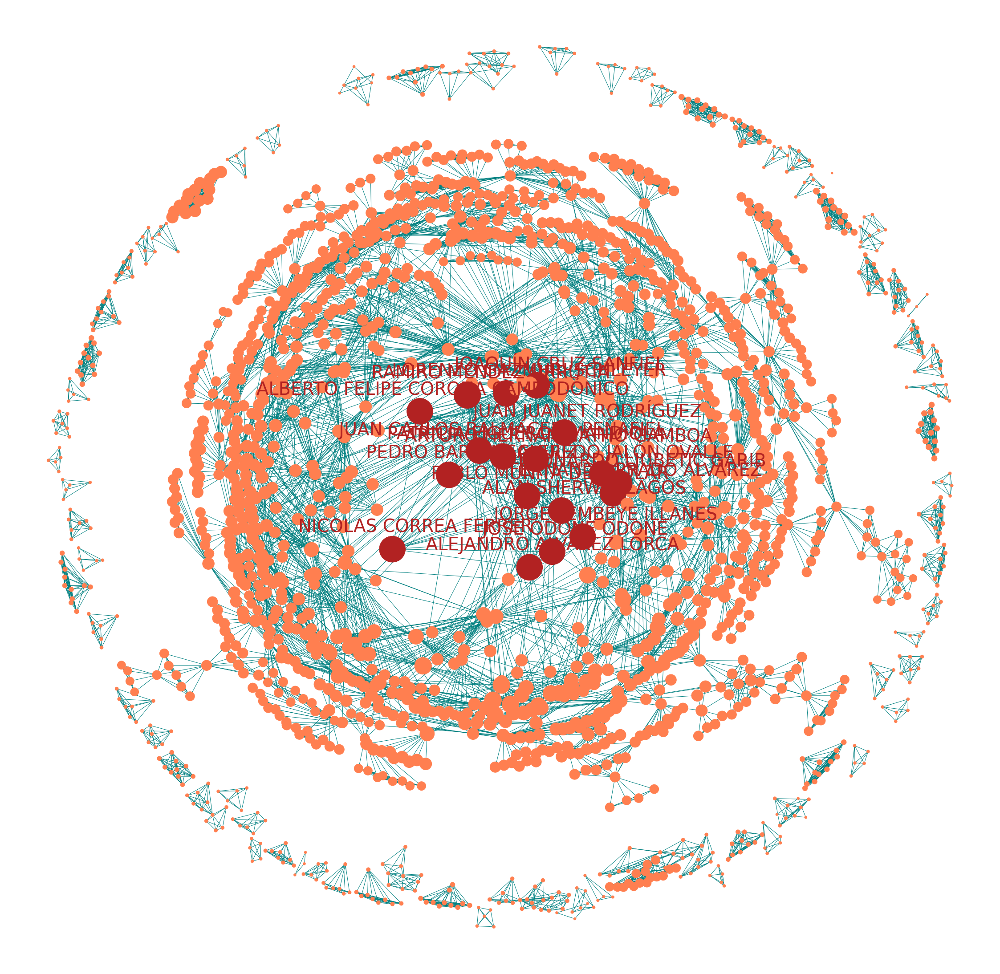

In [18]:
eigen = nx.eigenvector_centrality(G, max_iter = 300)
networkplot(0.23, dict(eigen), howmiddle = 0.25, seed = 300, scale = 5000, wscale = 2)

**Red considerando el tamaño de nodo según su cercanía, se marcan los nodos con grado mayor a 0.18**

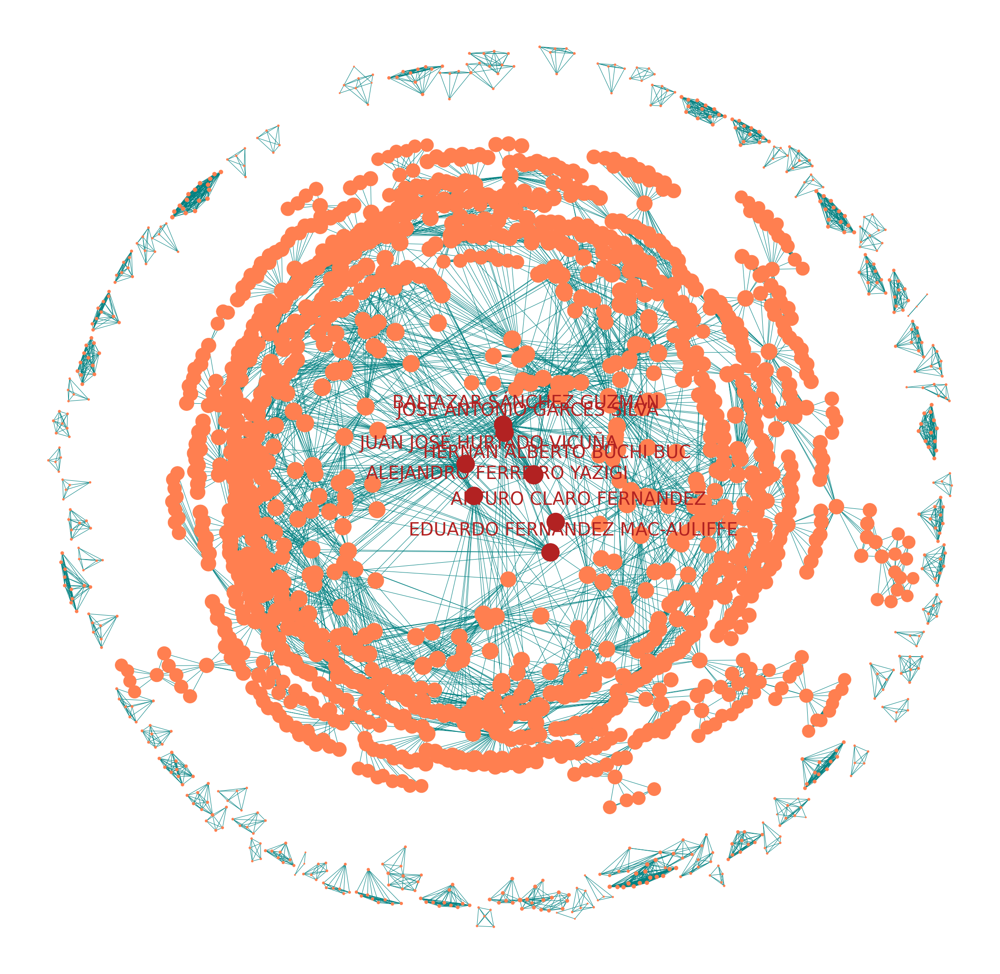

In [19]:
networkplot(0.18, dict(nx.closeness_centrality(G)), howmiddle = 0.17, seed = 300, scale = 9000, wscale = 1)

**Red considerando el tamaño de nodo según su betweenness centrality, se marcan los nodos con grado mayor a 0.032**

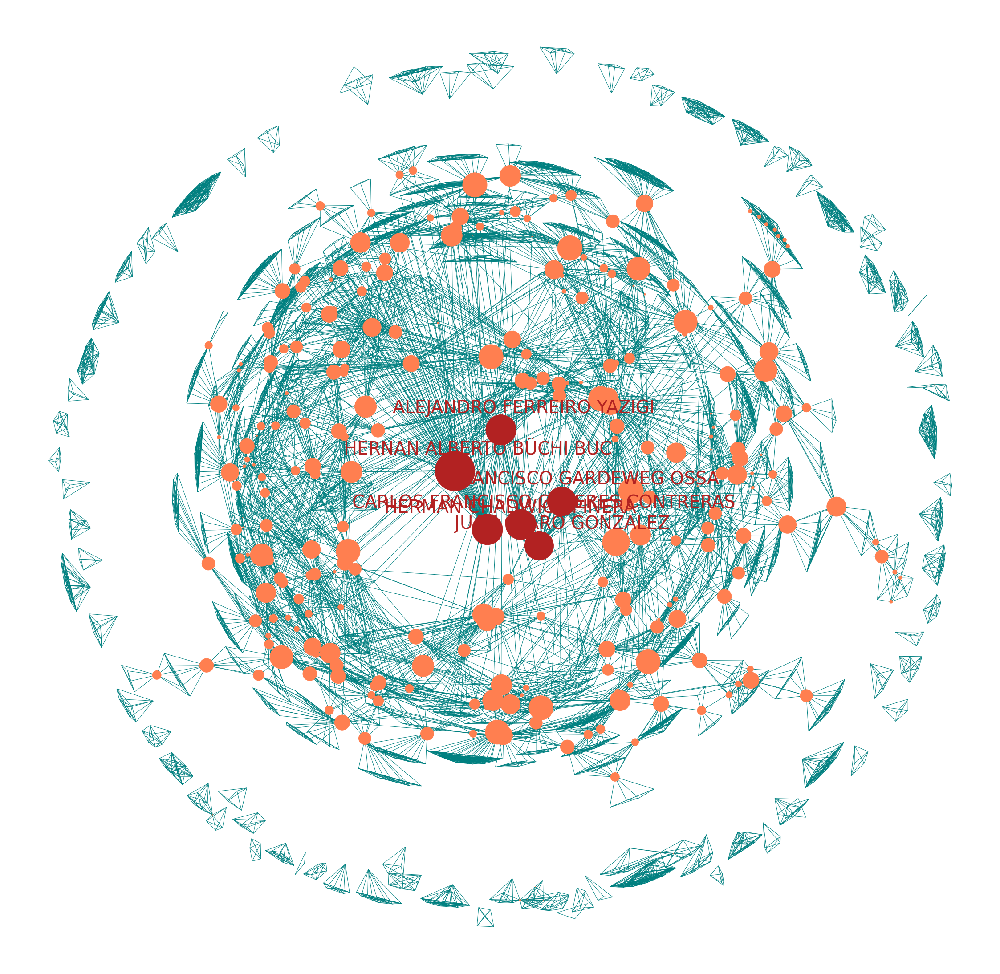

In [20]:
networkplot(0.032, dict(nx.betweenness_centrality(G)), howmiddle = 0.15, seed = 300, scale = 130000, wscale = 1)

**Red considerando solo la red principal y tamaño de nodo según su grado, solo se etiquetan si su valor es sobre 0.35**

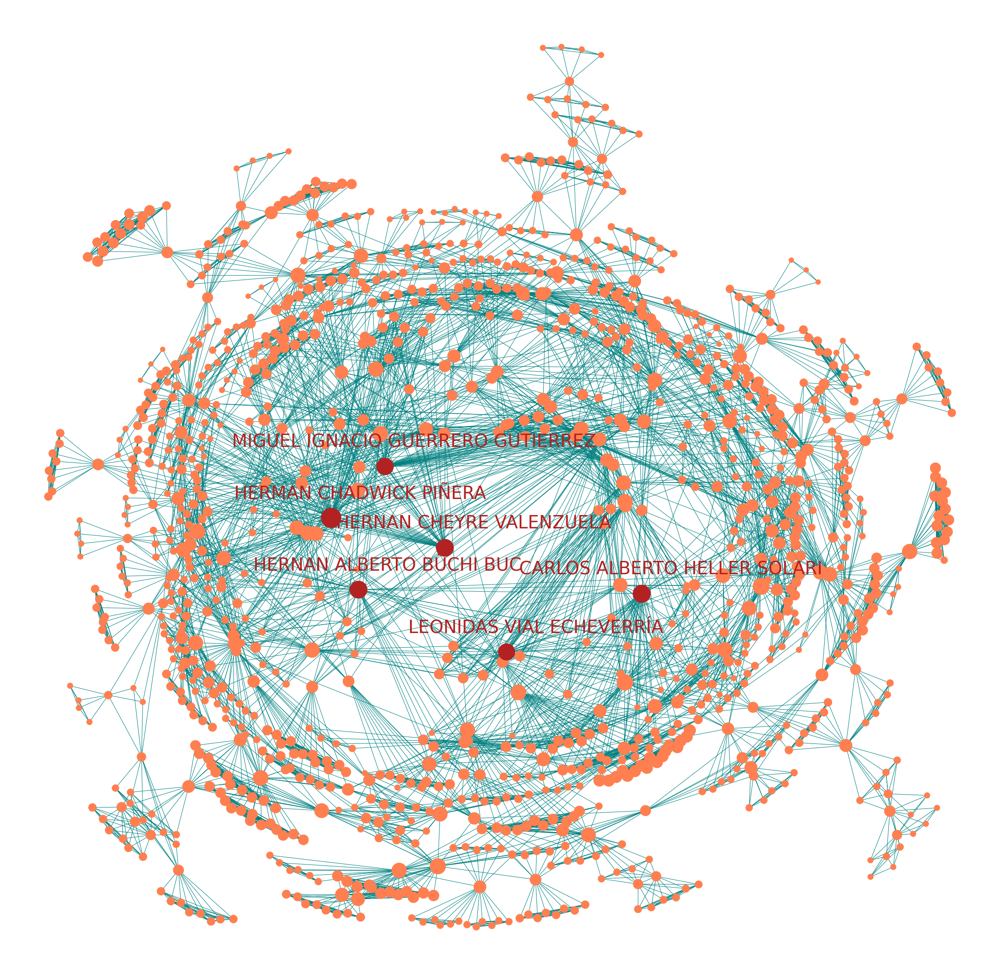

In [21]:
#Se almacena la componente más grande del grafo
largest_cc = max(nx.connected_components(G), key=len)
largest_cc

#Se crea un subgraph para almacenar el grafo en la variable G. Debido a que la función creada necesita
#que el plot principal sea G se reemplaza la variable y luego se guarda en otra variable para utilizarla
G = G.subgraph(largest_cc)
N = G
#Se grafica el grafo
networkplot(35, dict(G.degree()), howmiddle = 0.3, seed = 300)
#Se vuelve G como el grafo general
G = H

# 3- Calcular todas las medidas de centralidad conocidas y rankear en cada una de ellas, los primeros 5 directores.

**Centralidad: grado**

In [22]:
degreecentr = G.degree()
degreecentr_df = pd.DataFrame(degreecentr, columns = ["Director","Degree"])
degreecentr_df.sort_values("Degree", ascending = False, inplace = True)
degreecentr_df.iloc[0:5,]

,Director,Degree
693,HERMAN CHADWICK PIÑERA,50
237,CARLOS ALBERTO HELLER SOLARI,39
701,HERNAN CHEYRE VALENZUELA,38
695,HERNAN ALBERTO BÜCHI BUC,38
1334,MIGUEL IGNACIO GUERRERO GUTIERREZ,36


**Centralidad: Closeness**

In [23]:
closeness = nx.closeness_centrality(G)
dfcloseness = pd.DataFrame(closeness.items(), columns = ["Director","Closeness"])
dfcloseness.sort_values("Closeness", ascending = False, inplace = True)
dfcloseness.iloc[0:5,]

,Director,Closeness
695,HERNAN ALBERTO BÜCHI BUC,0.199069
1030,JUAN JOSÉ HURTADO VICUÑA,0.184064
887,JOSE ANTONIO GARCES SILVA,0.182490
197,BALTAZAR SÁNCHEZ GUZMÁN,0.181654
185,ARTURO CLARO FERNANDEZ,0.181496


**Centralidad: Betweenness**

In [24]:
betweenness = nx.betweenness_centrality(G)
dfbetweenness_centrality = pd.DataFrame(betweenness.items(), columns = ["Director","Betweenness"])
dfbetweenness_centrality.sort_values("Betweenness", ascending = False, inplace = True)
dfbetweenness_centrality.iloc[0:5,]

,Director,Betweenness
695,HERNAN ALBERTO BÜCHI BUC,0.061482
693,HERMAN CHADWICK PIÑERA,0.036551
37,ALEJANDRO FERREIRO YAZIGI,0.035817
254,CARLOS FRANCISCO CÁCERES CONTRERAS,0.035295
552,FRANCISCO GARDEWEG OSSA,0.032687


**Centralidad: Eigenvector** 

In [25]:
eigen = nx.eigenvector_centrality(G, max_iter = 300)
dfeigen = pd.DataFrame(eigen.items(), columns = ["Director","Eigenvector"])
dfeigen.sort_values("Eigenvector", ascending = False, inplace = True)
dfeigen.iloc[0:5,]

,Director,Eigenvector
1527,RAMIRO MÉNDEZ URRUTIA,0.250689
933,JOSE ODONE ODONE,0.233310
1416,PATRICIA FIGUEROA MANDIOLA,0.233310
815,JOAQUÍN CRUZ SANFIEL,0.233310
31,ALEJANDRO ALVAREZ LORCA,0.233310


# 4 - Interpretar resultados.

Para interpretar los resultados se irá analizando el resultado de los distintos grados calculados. Además se considerará otra información del dataframe original para complementar el análisis.

#### Análisis centralidad grado

In [26]:
#Cantidad de directorios donde participó Herman Chadwick Piñera
data[data.Nombre == "HERMAN CHADWICK PIÑERA"].shape[0]

6

In [27]:
#Cantidad de directorios donde participó Carlos Alberto Heller solari
data[data.Nombre == "CARLOS ALBERTO HELLER SOLARI"].shape[0]

6

In [28]:
#Cantidad de directorios donde participó Hernan Cheyre Valenzuela
data[data.Nombre == "HERNAN CHEYRE VALENZUELA"].shape[0]

4

In [29]:
#Cantidad de directorios donde participó Herman Chadwick Piñera
data[data.Nombre == "HERNAN ALBERTO BÜCHI BUC"].shape[0]

6

In [30]:
#Cantidad de directorios donde participó Miguel Ignacio Guerrero Gutierrez
data[data.Nombre == "MIGUEL IGNACIO GUERRERO GUTIERREZ"].shape[0]

4

Respecto al análisis de los grados de los nodos, obtenemos que:

| Nombre                          |  Valor  |
|---------------------------------|---------|
|   HERMAN CHADWICK PIÑERA	      |50       |
|	CARLOS ALBERTO HELLER SOLARI  |39       |
|	HERNAN CHEYRE VALENZUELA	  |38       |
|	HERNAN ALBERTO BÜCHI BUC	  |38       |
|	MIGUEL IGNACIO GUERRERO 	  |36       |

Debido a que el grado del nodo depende de las conecciones que tenga cada persona (nodos), Herman Chadwick Piñera es la persona con más conecciones, por 11 conecciones por sobre el segundo lugar Carlos Alberto Heller Solari con un valor de grado de 39. Esto nos podría indicar dos cosas, que Herman Chadwick Piñera trabajó en directorios con una gran cantidad de personas y/o que trabajó en una gran cantidad de directorios. Pero si comparamos en cuantos directorios estuvo cada uno, tanto Herman como Carlos estuvieron en la misma cantidad de directorios, lo que nos indica que Herman estuvo en directorios con una mayor cantidad de gente.

#### Closeness

In [31]:
closeness_mi = nx.closeness_centrality(N)
dfcloseness_mi = pd.DataFrame(closeness_mi.items(), columns = ["Director","Closeness"])
dfcloseness_mi.sort_values("Closeness", ascending = False, inplace = True)


In [32]:
#Todos los valores de closeness parecen ser similares, se comprobará calculando la proporción.
perc = dfcloseness_mi[dfcloseness_mi.Closeness > 0.16].shape[0]/len(dfcloseness_mi)*100
print("El porcentaje de valores por sobre 0.16 en la centralidad closeness es {:.2f}%".format(perc))

El porcentaje de valores por sobre 0.16 en la centralidad closeness es 90.88%


Respecto al análisis de closeness, obtenemos que:
    
| Nombre                          |  Valor  |
|---------------------------------|---------|
| 	HERNAN ALBERTO BÜCHI BUC	  | 0.199069|
|	JUAN JOSÉ HURTADO VICUÑA	  | 0.184064|
|	JOSE ANTONIO GARCES SILVA	  | 0.182490|
|	BALTAZAR SÁNCHEZ GUZMÁN	      | 0.181654|
|	ARTURO CLARO FERNANDEZ	      | 0.181496| 

El grado closeness nos indica que tan céntrico es el nodo respecto a sus conecciones, mientras mayor sea el valor es más céntrico. Aunque exista una persona con un mayor valor de closeness, en su mayoría tienen un valor muy cercano, teniendo el 90% de las personas por sobre 0.16 en el valor de esta centralidad. Esto nos puede indicar una red relativamente uniforme y que indiferentemente del camino que se elija la información fluirá a la misma velocidad. Aun así el que mayor grado de closeness la tiene es Hernan Alberto Büchi Buc, siendo el más céntrico de la red.

#### Betweenness

Respecto al análisis de betweenness, obtenemos que:


| Nombre                          |  Valor  |
|---------------------------------|---------|
| HERNAN ALBERTO BÜCHI BUC	      | 0.061482|
| HERMAN CHADWICK PIÑERA	      | 0.036551|
| ALEJANDRO FERREIRO YAZIGI	      | 0.035817|
| CARLOS FRANCISCO CÁCERES        |	0.035295|
|FRANCISCO GARDEWEG OSSA	      | 0.032687|


Aunque el grado de Herman Chadwick es el mayor,  Hernan  Alberto Büchi tiene el mayor betweenness y closeness.  Esto podría indicarnos que Herman Chadwick era participante de directorios grandes pero con gente que ya tuvo relación previamente, mientras que Herman Alberto Büchi, aunque participó de directorios más pequeños, era con personas nuevas con las que no había participado anteriormente.

#### Eigenvector

Para entender mejor esta centralidad, es necesario ver la información de las personas en el ranking.

In [33]:
#El primer lugar participó del directorio 72, 235, 298
data[data.Nombre == "RAMIRO MÉNDEZ URRUTIA"]

,RUT,Nombre,Cargo,Fecha Nombramiento,Directorio
552,52018390,RAMIRO MÉNDEZ URRUTIA,Vicepresidente,2018-03-27,72
1753,52018390,RAMIRO MÉNDEZ URRUTIA,Director,2016-04-26,235
2207,52018390,RAMIRO MÉNDEZ URRUTIA,Director,2018-03-27,298


In [34]:
#El segundo lugar participó en el directorio 298
data[data.Nombre == "JOSE ODONE ODONE"]

,RUT,Nombre,Cargo,Fecha Nombramiento,Directorio
2215,32458475,JOSE ODONE ODONE,Director Suplente,2018-03-27,298


In [35]:
#El tercer lugar participó en el directorio 298
data[data.Nombre == "PATRICIA FIGUEROA MANDIOLA"]

,RUT,Nombre,Cargo,Fecha Nombramiento,Directorio
2216,71301745,PATRICIA FIGUEROA MANDIOLA,Director Suplente,2018-03-27,298


In [36]:
#Se hace necesario analizar el directorio 298
data[(data.Directorio == 298)]

,RUT,Nombre,Cargo,Fecha Nombramiento,Directorio
2206,42320692,FERNANDO PRADO ALVAREZ,Presidente,2018-03-27,298
2207,52018390,RAMIRO MÉNDEZ URRUTIA,Director,2018-03-27,298
2208,68100038,LORENZO GAZMURI SCHLEYER,Director,2018-03-27,298
2209,68169771,JUAN JUANET RODRÍGUEZ,Director,2018-03-27,298
2210,70911485,PABLO MUNITA DEL SOLAR,Director,2018-03-27,298
2211,75648707,ARTURO HERNAN NATHO GAMBOA,Director,2018-03-27,298
2212,90983733,JOAQUÍN CRUZ SANFIEL,Director,2018-03-27,298
2213,102561201,PEDRO BARRÍA SCHULZ,Director,2018-03-27,298
2214,132342296,NICOLAS CORREA FERRER,Director,2018-03-27,298
2215,32458475,JOSE ODONE ODONE,Director Suplente,2018-03-27,298


In [37]:
#Son personas que no han aparecido en rankings anteriores para otras centralidades
#Su valor es mucho más grande que los dos principales en los rankings anteriores
dfeigen[(dfeigen.Director == "HERMAN CHADWICK PIÑERA") | (dfeigen.Director == "HERNAN ALBERTO BÜCHI BUC")]

,Director,Eigenvector
695,HERNAN ALBERTO BÜCHI BUC,0.001716
693,HERMAN CHADWICK PIÑERA,0.000730


Respecto al análisis del eigenvector, obtenemos que:

| Nombre                          |  Valor  |
|---------------------------------|---------|
| RAMIRO MÉNDEZ URRUTIA           |	0.250689|
| JOSE ODONE ODONE	              | 0.233310|
| PATRICIA FIGUEROA MANDIOLA	  | 0.233310|
| JOAQUÍN CRUZ SANFIEL            | 0.233310|
| ALEJANDRO ALVAREZ LORCA	      | 0.233310|

La centralidad eigenvector considera la importancia de las conecciones de cada nodo al que están conectados. Es importante notar que los que tuvieron un valor más alto de eigenvector no aparecían en las secciones anteriores. Esto podría ser indicio que aunque no tuvieron una participación muy grande si estuvieron presente en los directorios con conexiones muy importantes. 

### Conclusión

Analizando el grafo  de las sociedades que transan en la Bolsa de Valores de Santiago y las centralidades resultante de este, se pudo concluir que Hernan Alberto Büchi y Herman Chadwick Piñera son las personas más importantes en cuanto a participación. Mientras que Herman Chadwick participó en muchos directorios que contenían una gran cantidad de gente conocida, Hernan Büchi participó  en una gran cantidad de directorios pero con gente nueva. Aún así, siendo personas tan improtantes, sus conecciones no lo eran y eso se demuestra en su centralidad eigenvector. Un posterior análisis importante sería revisar las conecciones del directorio 298.